In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np
import os
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import LSTM, Dense, Flatten, Dropout
from tensorflow.keras.preprocessing import image
from sklearn.metrics import classification_report


def extract_frame_number(frame_path):
    base_name = os.path.basename(frame_path)
    frame_number = ''.join(filter(str.isdigit, base_name))
    return int(frame_number)

def build_cnn():
    base_model = VGG16(weights='imagenet', include_top=False)
    model = Model(inputs=base_model.input, outputs=base_model.get_layer('block5_pool').output)
    return model

cnn_model = build_cnn()

def extract_features(frame_paths, cnn_model):
    features = []
    for frame_path in frame_paths:
        img = image.load_img(frame_path, target_size=(224, 224))
        img_data = image.img_to_array(img)
        img_data = np.expand_dims(img_data, axis=0)
        img_data = preprocess_input(img_data)
        feature = cnn_model.predict(img_data)
        features.append(feature.flatten())
    return np.array(features)

def load_data(video_dirs, cnn_model):
    X, y = [], []
    for video_dir, label in video_dirs:
        frame_paths = [os.path.join(video_dir, f) for f in os.listdir(video_dir) if f.endswith('.jpg')]
        frame_paths.sort(key=extract_frame_number)
        features = extract_features(frame_paths, cnn_model)
        X.append(features)
        y.append(label)
    return np.array(X), np.array(y)

train_video_dirs = [
    ('/content/drive/MyDrive/vdos/weapon/video_0', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_0 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_1 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_1', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_2 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_2', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_3 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_3', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_4 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_4', 1),
    ('/content/drive/MyDrive/vdos/safe/video_0', 0),
    ('/content/drive/MyDrive/vdos/safe/video_0 (1)', 0),
    ('/content/drive/MyDrive/vdos/safe/video_1', 0),
    ('/content/drive/MyDrive/vdos/safe/video_1 (1)', 0),
    ('/content/drive/MyDrive/vdos/safe/video_2', 0),
    ('/content/drive/MyDrive/vdos/safe/video_2 (1)', 0),
    ('/content/drive/MyDrive/vdos/safe/video_3', 0),
    ('/content/drive/MyDrive/vdos/safe/video_3 (1)', 0),
    ('/content/drive/MyDrive/vdos/safe/video_4', 0),
    ('/content/drive/MyDrive/vdos/safe/video_4 (1)', 0)
]

val_video_dirs = [
    ('/content/drive/MyDrive/vdos/safe/video_7', 0),
    ('/content/drive/MyDrive/vdos/safe/video_8', 0),
    ('/content/drive/MyDrive/vdos/safe/video_9', 0),
    ('/content/drive/MyDrive/vdos/weapon/video_5', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_5 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_4 (1)', 1),
    ('/content/drive/MyDrive/vdos/weapon/video_4', 1),
    ('/content/drive/MyDrive/vdos/safe/video_0 (1)', 0)
]

X_train, y_train = load_data(train_video_dirs, cnn_model)
X_val, y_val = load_data(val_video_dirs, cnn_model)

def build_model():
    model = Sequential()
    model.add(LSTM(256, return_sequences=True, input_shape=(None, 7*7*512)))
    model.add(LSTM(128, return_sequences=False))
    model.add(Dense(64, activation='relu')) # Adding the dense layers
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

model = build_model()

history = model.fit(
    X_train, y_train,
    epochs=30,
    batch_size=4,
    validation_data=(X_val, y_val)
)

model.save('/content/drive/MyDrive/vdos/videoclassification.h5')

loss, accuracy = model.evaluate(X_val, y_val)
print(f'Validation accuracy: {accuracy * 100:.2f}%')


y_pred = (model.predict(X_val) > 0.5).astype("int32")
report = classification_report(y_val, y_pred, target_names=['Safe', 'Weapon'])
print('Classification Report:')
print(report)

1/1 [==============================] - 0s 18ms/step
Epoch 1/30
5/5 [==============================] - 7s 321ms/step - loss: 0.9349 - accuracy: 0.5000 - val_loss: 0.5514 - val_accuracy: 0.6250
Epoch 2/30
5/5 [==============================] - 0s 55ms/step - loss: 0.5785 - accuracy: 0.6500 - val_loss: 0.4521 - val_accuracy: 1.0000
Epoch 3/30
5/5 [==============================] - 0s 55ms/step - loss: 0.3884 - accuracy: 0.9500 - val_loss: 0.3763 - val_accuracy: 0.8750
Epoch 4/30
5/5 [==============================] - 0s 55ms/step - loss: 0.2936 - accuracy: 0.9000 - val_loss: 0.3442 - val_accuracy: 0.8750
Epoch 5/30
5/5 [==============================] - 0s 44ms/step - loss: 0.1740 - accuracy: 1.0000 - val_loss: 0.3601 - val_accuracy: 0.7500
Epoch 6/30
5/5 [==============================] - 0s 41ms/step - loss: 0.1020 - accuracy: 1.0000 - val_loss: 0.3984 - val_accuracy: 0.7500
Epoch 7/30
5/5 [==============================] - 0s 45ms/step - loss: 0.0639 - accuracy: 1.0000 - val_loss: 0.53

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1/1 [==============================] - 1s 1s/step - loss: 0.7540 - accuracy: 0.7500
Validation accuracy: 75.00%
1/1 [==============================] - 1s 941ms/step
Classification Report:
              precision    recall  f1-score   support

        Safe       1.00      0.50      0.67         4
      Weapon       0.67      1.00      0.80         4

    accuracy                           0.75         8
   macro avg       0.83      0.75      0.73         8
weighted avg       0.83      0.75      0.73         8



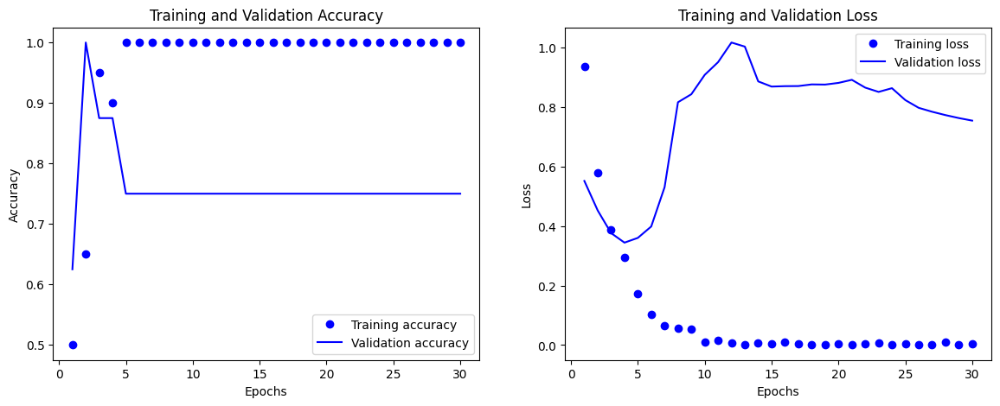

In [3]:
import matplotlib.pyplot as plt

# Plotting accuracy and loss for training and validation
def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Plot training and validation accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo', label='Training accuracy')
    plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_training_history(history)

In [5]:
from tensorflow.keras.models import Model, Sequential, load_model

lstm_model = load_model('/content/drive/MyDrive/vdos/videoclassification.h5')

# Feature extraction
def extract_video_features(video_dir, cnn_model):
    frame_paths = [os.path.join(video_dir, f) for f in os.listdir(video_dir) if f.endswith('.jpg')]
    frame_paths.sort(key=extract_frame_number)
    features = extract_features(frame_paths, cnn_model)
    return np.array(features)

# Predict the output for a specific video
video_dir = '/content/drive/MyDrive/vdos/weapon/video_5 (1)'
video_features = extract_video_features(video_dir, cnn_model)

# Add batch dimension (batch_size, sequence_length, feature_dim)
video_features = np.expand_dims(video_features, axis=0)

# prediction
prediction = lstm_model.predict(video_features)

1/1 [==============================] - 0s 16ms/step


In [9]:
from google.colab import drive
from IPython.display import Video

# Path to your video file in Google Drive
video_path = '/content/drive/MyDrive/vdos/weapon/video_5 (1).mp4'

# Display the video
Video(video_path, embed=True, width=600, height=400)

In [10]:
if prediction[0] > 0.5:
    print(f'The video {video_dir} is classified as Weapon.')
else:
    print(f'The video {video_dir} is classified as Safe.')

The video /content/drive/MyDrive/vdos/weapon/video_5 (1) is classified as Weapon.


In [11]:
video_dir = '/content/drive/MyDrive/vdos/safe/video_0'
video_features = extract_video_features(video_dir, cnn_model)

# Add batch dimension (batch_size, sequence_length, feature_dim)
video_features = np.expand_dims(video_features, axis=0)
prediction = lstm_model.predict(video_features)


1/1 [==============================] - 1s 1s/step
The video /content/drive/MyDrive/vdos/safe/video_0 is classified as Safe.


In [12]:
if prediction[0] > 0.5:
    print(f'The video {video_dir} is classified as Weapon.')
else:
    print(f'The video {video_dir} is classified as Safe.')

The video /content/drive/MyDrive/vdos/safe/video_0 is classified as Safe.


In [13]:
video_path = '/content/drive/MyDrive/vdos/safe/video_0.mp4'

# Display the video
Video(video_path, embed=True, width=600, height=400)